### Required libraries

In [ ]:
try:
    import pycountry_convert
except ImportError:
    !pip install pycountry_convert
try:
    import plotly_express
except ImportError:
    !pip install plotly_express

import seaborn as sns
import pandas as pd
import numpy as np
import datetime as dt
import requests
import sys
from itertools import chain
import pycountry
import pycountry_convert as pc
import plotly_express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
%matplotlib inline

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 21.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.7/228.7 kB 4.9 MB/s eta 0:00:00
  Created wheel for pycountry: filename=pycountry-22.3.5-py2.py3-none-any.whl size=10681831 sha256=895238990368c9a4acfbcc9b9a7336d558b10bab55fe1a52b360842197857de7
  Stored in directory: /root/.cache/pip/wheels/03/57/cc/290c5252ec97a6d78d36479a3c5e5ecc76318afcb241ad9dbe
Successfully built pycountry


### Fetching Datasets

In [ ]:
try:
  covid = pd.read_csv('https://drive.google.com/uc?id=1Xbhj1nR_g-GjZzCp7Dhg8FQpOKT2eF9Q')
  time = pd.read_csv('https://drive.google.com/uc?id=1DbKwWFlpC3ePsK1ecSvqKkaxyYUXtwn3')
  trend = pd.read_csv('https://drive.google.com/uc?id=1roWNZd-l6odLKEfcJYvpaU7ZbIswohPd')
  weather = pd.read_csv('https://drive.google.com/uc?id=1wPwuFHMQR5mXwLNjXKrENys9pT3ppgRC')
  Age = pd.read_csv('https://drive.google.com/uc?id=1-nG7Lc-VS5WU52oXtbH2e6ONX9Ho6oaA')
except ValueError as e:
  print(f" File is not present in current directory. Please check and try again! ")

In [ ]:
covid

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
0,1,01/22/2020,Anhui,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
1,2,01/22/2020,Beijing,Mainland China,1/22/2020 17:00,14.0,0.0,0.0
2,3,01/22/2020,Chongqing,Mainland China,1/22/2020 17:00,6.0,0.0,0.0
3,4,01/22/2020,Fujian,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
4,5,01/22/2020,Gansu,Mainland China,1/22/2020 17:00,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
306424,306425,05/29/2021,Zaporizhia Oblast,Ukraine,2021-05-30 04:20:55,102641.0,2335.0,95289.0
306425,306426,05/29/2021,Zeeland,Netherlands,2021-05-30 04:20:55,29147.0,245.0,0.0
306426,306427,05/29/2021,Zhejiang,Mainland China,2021-05-30 04:20:55,1364.0,1.0,1324.0
306427,306428,05/29/2021,Zhytomyr Oblast,Ukraine,2021-05-30 04:20:55,87550.0,1738.0,83790.0


## Performing EDA

In [ ]:
print('Shape',covid.shape)
print('columns',covid.columns)
print('Datatypes',covid.dtypes)
print(covid.head())

Shape (306429, 8)
columns Index(['SNo', 'ObservationDate', 'Province/State', 'Country/Region',
       'Last Update', 'Confirmed', 'Deaths', 'Recovered'],
      dtype='object')
Datatypes SNo                  int64
ObservationDate     object
Province/State      object
Country/Region      object
Last Update         object
Confirmed          float64
Deaths             float64
Recovered          float64
dtype: object
   SNo ObservationDate Province/State  Country/Region      Last Update  \
0    1      01/22/2020          Anhui  Mainland China  1/22/2020 17:00   
1    2      01/22/2020        Beijing  Mainland China  1/22/2020 17:00   
2    3      01/22/2020      Chongqing  Mainland China  1/22/2020 17:00   
3    4      01/22/2020         Fujian  Mainland China  1/22/2020 17:00   
4    5      01/22/2020          Gansu  Mainland China  1/22/2020 17:00   

   Confirmed  Deaths  Recovered  
0        1.0     0.0        0.0  
1       14.0     0.0        0.0  
2        6.0     0.0        0.0  
3  

<ipython-input-5-76c7290a5012>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  covid.corr()
<ipython-input-5-76c7290a5012>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(covid.corr())


<Axes: >

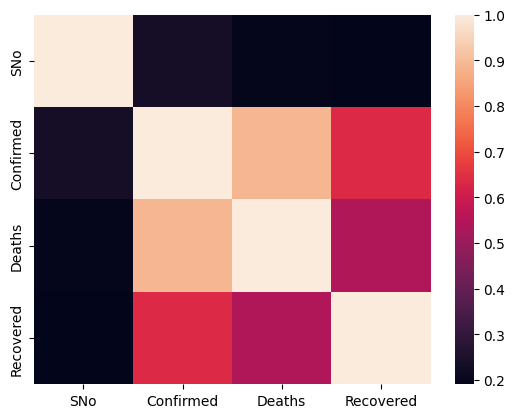

In [ ]:
covid.corr()
sns.heatmap(covid.corr())

In [ ]:
print(covid.describe())
covid['Country/Region'].unique()

                 SNo     Confirmed         Deaths     Recovered
count  306429.000000  3.064290e+05  306429.000000  3.064290e+05
mean   153215.000000  8.567091e+04    2036.403268  5.042029e+04
std     88458.577156  2.775516e+05    6410.938048  2.015124e+05
min         1.000000 -3.028440e+05    -178.000000 -8.544050e+05
25%     76608.000000  1.042000e+03      13.000000  1.100000e+01
50%    153215.000000  1.037500e+04     192.000000  1.751000e+03
75%    229822.000000  5.075200e+04    1322.000000  2.027000e+04
max    306429.000000  5.863138e+06  112385.000000  6.399531e+06


array(['Mainland China', 'Hong Kong', 'Macau', 'Taiwan', 'US', 'Japan',
       'Thailand', 'South Korea', 'China', 'Kiribati', 'Singapore',
       'Philippines', 'Malaysia', 'Vietnam', 'Australia', 'Mexico',
       'Brazil', 'Colombia', 'France', 'Nepal', 'Canada', 'Cambodia',
       'Sri Lanka', 'Ivory Coast', 'Germany', 'Finland',
       'United Arab Emirates', 'India', 'Italy', 'UK', 'Russia', 'Sweden',
       'Spain', 'Belgium', 'Others', 'Egypt', 'Iran', 'Israel', 'Lebanon',
       'Iraq', 'Oman', 'Afghanistan', 'Bahrain', 'Kuwait', 'Austria',
       'Algeria', 'Croatia', 'Switzerland', 'Pakistan', 'Georgia',
       'Greece', 'North Macedonia', 'Norway', 'Romania', 'Denmark',
       'Estonia', 'Netherlands', 'San Marino', ' Azerbaijan', 'Belarus',
       'Iceland', 'Lithuania', 'New Zealand', 'Nigeria', 'North Ireland',
       'Ireland', 'Luxembourg', 'Monaco', 'Qatar', 'Ecuador',
       'Azerbaijan', 'Czech Republic', 'Armenia', 'Dominican Republic',
       'Indonesia', 'Portugal

## Data Cleaning and Carpentry

In [ ]:
covid.rename(columns={'ObservationDate':'Date','Province/State':'Province',
                   'Country/Region':'Country','Confirmed':'ConfirmedCases',},inplace=True)

In [ ]:
temp = {
    'Gambia, The': 'Gambia',
    'Bahamas, The': 'Bahamas',
    'Timor-Leste': 'East Timor',
    'occupied Palestinian territory': 'West Bank and Gaza',
    "('St. Martin',)": 'Saint Martin',
    'Congo (Kinshasa)': 'Democratic Republic of the Congo',
    'Congo (Brazzaville)': 'Republic of the Congo',
    'Republic of Ireland': 'Ireland',
    'MS Zaandam': 'Cruise Ship (MS Zaandam)',
    'Diamond Princess': 'Cruise Ship (Diamond Princess)',
    'Mainland China' : 'China', }
covid['Country'] = covid['Country'].replace(temp)
unique = covid['Country'].unique()

In [ ]:
covid['Date'] = pd.to_datetime(covid['Date'],format='%m/%d/%Y')
covid['Day'] = covid.Date.dt.dayofyear
covid

,SNo,Date,Province,Country,Last Update,ConfirmedCases,Deaths,Recovered,Day
0,1,2020-01-22,Anhui,China,1/22/2020 17:00,1.0,0.0,0.0,22
1,2,2020-01-22,Beijing,China,1/22/2020 17:00,14.0,0.0,0.0,22
2,3,2020-01-22,Chongqing,China,1/22/2020 17:00,6.0,0.0,0.0,22
3,4,2020-01-22,Fujian,China,1/22/2020 17:00,1.0,0.0,0.0,22
4,5,2020-01-22,Gansu,China,1/22/2020 17:00,0.0,0.0,0.0,22
...,...,...,...,...,...,...,...,...,...
306424,306425,2021-05-29,Zaporizhia Oblast,Ukraine,2021-05-30 04:20:55,102641.0,2335.0,95289.0,149
306425,306426,2021-05-29,Zeeland,Netherlands,2021-05-30 04:20:55,29147.0,245.0,0.0,149
306426,306427,2021-05-29,Zhejiang,China,2021-05-30 04:20:55,1364.0,1.0,1324.0,149
306427,306428,2021-05-29,Zhytomyr Oblast,Ukraine,2021-05-30 04:20:55,87550.0,1738.0,83790.0,149


In [ ]:
class country_func():
    def __init__(self):
        self.d = {}

    def get_dic(self):
        return self.d

    def get_details(self,country):
        """Returns country code(alpha_3) and continent"""
        try:
            country_1 = pycountry.countries.get(name=country)
            if country_1 is None:
                c = pycountry.countries.search_fuzzy(country)
                country_1 = c[0]
            continent_c = pc.country_alpha2_to_continent_code(country_1.alpha_2)
            continent = pc.convert_continent_code_to_continent_name(continent_c)
            return country_1.alpha_3, continent
        except:
            if 'Congo' in country:
                country = 'Congo'
            elif country == 'Diamond Princess' or country == 'Laos' or country == 'MS Zaandam' or country == 'Holy See' or country == 'Timor-Leste':
              return country, country
            elif country == 'Korea, South' or country == 'South Korea':
                country = 'Korea, Republic of'
            elif country == 'Taiwan*':
                country = 'Taiwan'
            elif country == 'Burma':
                country = 'Myanmar'
            elif country == 'West Bank and Gaza':
                country = 'Gaza'
            else:
                return country, country
            country_1 = pycountry.countries.search_fuzzy(country)
            continent_c = pc.country_alpha2_to_continent_code(country_1[0].alpha_2)
            continent = pc.convert_continent_code_to_continent_name(continent_c)
            return country_1[0].alpha_3, continent

    def get_iso3(self, country):
        return self.d[country]['code']
    def get_continent(self,country):
        return self.d[country]['continent']
    def add_values(self,country):
        self.d[country] = {}
        self.d[country]['code'],self.d[country]['continent'] = self.get_details(country)
    def fetch_iso3(self,country):
        if country in self.d.keys():
            return self.get_iso3(country)
        else:
            self.add_values(country)
            return self.get_iso3(country)
    def fetch_continent(self,country):
        if country in self.d.keys():
            return self.get_continent(country)
        else:
            self.add_values(country)
            return self.get_continent(country)

## Creating a dashboard displaying global Covid-19 cases

In [ ]:
covid.ConfirmedCases = np.abs(covid.ConfirmedCases)
df_tm = covid.copy()
date = df_tm.Date.max()
df_tm = df_tm[df_tm['Date']==date]
obj = country_func()
df_tm.Province.fillna('x',inplace=True)
df_tm['continent'] = df_tm.apply(lambda x: obj.fetch_continent(x['Country']), axis=1)
df_tm["world"] = "World"
dashboard = px.treemap(df_tm, path=['world', 'continent', 'Country'], values='ConfirmedCases',
                  color='ConfirmedCases', hover_data=['continent'],
                  color_continuous_scale='matter', title='Current share of Worldwide confimred COVID19 Cases')
dashboard.update_layout(height=600,width=1200,template='seaborn')
dashboard.show()

In [ ]:
covid['Date'] = covid['Date'].dt.strftime('%Y-%m-%d')
covid['Date'].dtypes

dtype('O')

### 1. What was the overall spread across the globe?

In [ ]:
covid['Date'] = pd.to_datetime(covid['Date'], format='%Y-%m-%d')
map = px.choropleth(covid,
                    locations='Country',
                    locationmode='country names',
                    color='ConfirmedCases',
                    hover_name='Country',
                    animation_frame=covid['Date'].dt.strftime('%Y-%m-%d'),
                    projection='natural earth',
                    title='COVID-19 Confirmed Cases Growth by Country',
                    color_continuous_scale='Viridis')
map.show()


#### 2. Did weather have any impact on the number of confirmed Covid-19 cases?

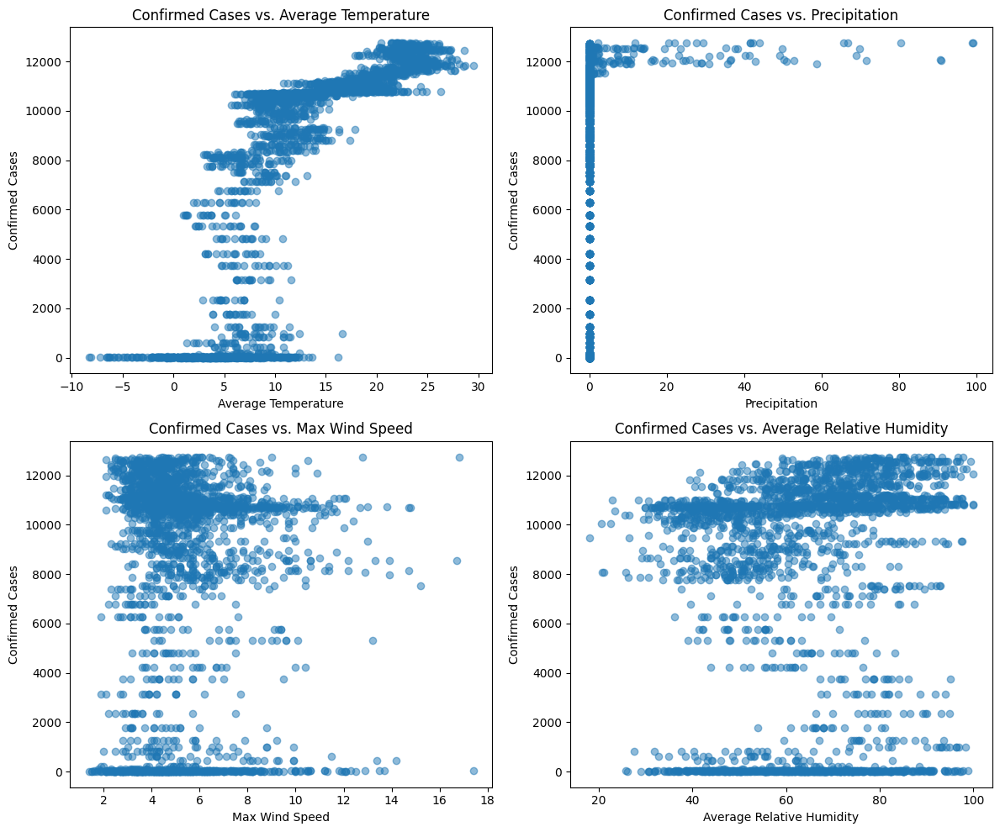

<Figure size 640x480 with 0 Axes>

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
merged_df = pd.merge(time, weather, on='date')
fig, axes = plt.subplots(2, 2, figsize=(12, 10))


axes[0, 0].scatter(merged_df['avg_temp'], merged_df['confirmed'], alpha=0.5)
axes[0, 0].set_xlabel('Average Temperature')
axes[0, 0].set_ylabel('Confirmed Cases')
axes[0, 0].set_title('Confirmed Cases vs. Average Temperature')

axes[0, 1].scatter(merged_df['precipitation'], merged_df['confirmed'], alpha=0.5)
axes[0, 1].set_xlabel('Precipitation')
axes[0, 1].set_ylabel('Confirmed Cases')
axes[0, 1].set_title('Confirmed Cases vs. Precipitation')

axes[1, 0].scatter(merged_df['max_wind_speed'], merged_df['confirmed'], alpha=0.5)
axes[1, 0].set_xlabel('Max Wind Speed')
axes[1, 0].set_ylabel('Confirmed Cases')
axes[1, 0].set_title('Confirmed Cases vs. Max Wind Speed')

axes[1, 1].scatter(merged_df['avg_relative_humidity'], merged_df['confirmed'], alpha=0.5)
axes[1, 1].set_xlabel('Average Relative Humidity')
axes[1, 1].set_ylabel('Confirmed Cases')
axes[1, 1].set_title('Confirmed Cases vs. Average Relative Humidity')

plt.tight_layout()
plt.show()
plt.savefig('plt.png')

### 3. Does age play an important role in Covid-19?

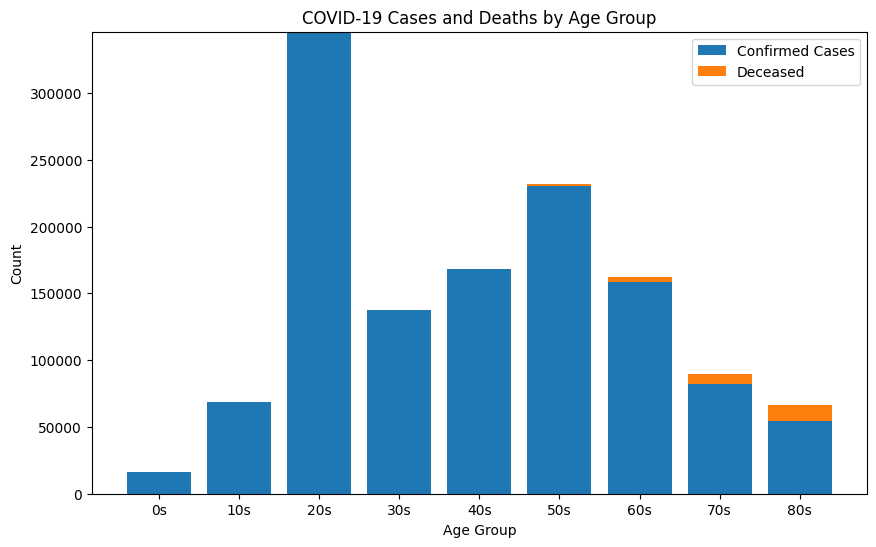

<Figure size 640x480 with 0 Axes>

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

age = Age.groupby('age').agg({'confirmed': 'sum', 'deceased': 'sum'}).reset_index()

age.sort_values('age', inplace=True)

plt.figure(figsize=(10, 6))
plt.bar(age['age'], age['confirmed'], label='Confirmed Cases')
plt.bar(age['age'], age['deceased'], bottom=age['confirmed'], label='Deceased')

plt.xlabel('Age Group')
plt.ylabel('Count')
plt.title('COVID-19 Cases and Deaths by Age Group')
plt.legend()

plt.show()
plt.savefig('plt1.png')

#### 4. Has there been any variation or evolution in the symptoms of COVID-19 over time?

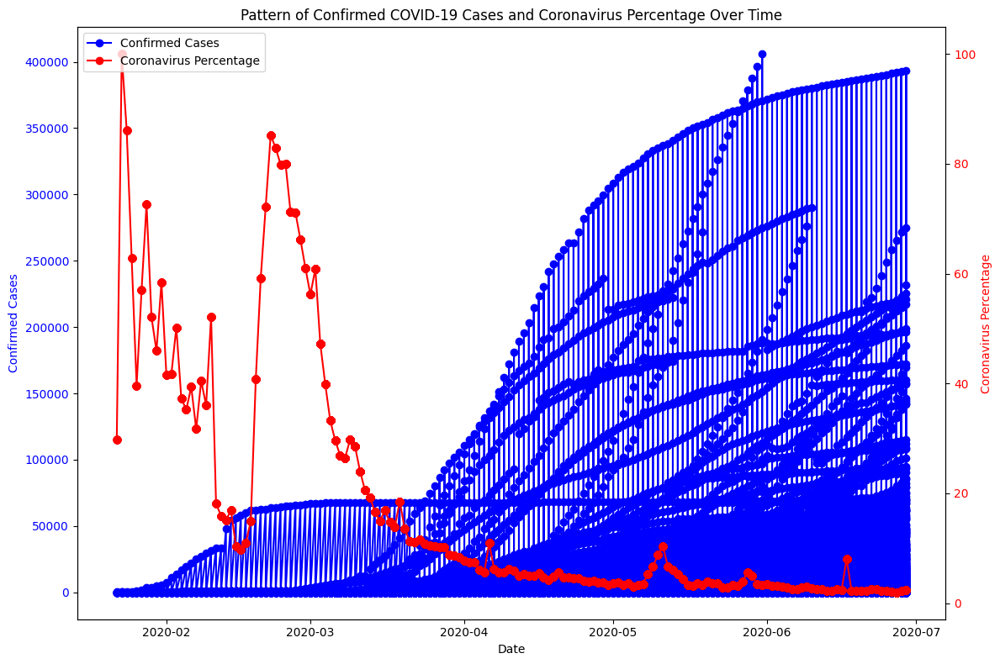

<Figure size 640x480 with 0 Axes>

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

covid.rename(columns={'Date':'date',},inplace=True)

covid['date'] = pd.to_datetime(covid['date'])
trend['date'] = pd.to_datetime(trend['date'])
merged_df = pd.merge(covid, trend, on='date')

fig, ax1 = plt.subplots(figsize=(12, 8))

ax1.plot(merged_df['date'], merged_df['ConfirmedCases'], label='Confirmed Cases', marker='o', color='blue')
ax1.set_xlabel('Date')
ax1.set_ylabel('Confirmed Cases', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_title('Pattern of Confirmed COVID-19 Cases and Coronavirus Percentage Over Time')

ax2 = ax1.twinx()
ax2.plot(merged_df['date'], merged_df['coronavirus'], label='Coronavirus Percentage', marker='o', color='red')
ax2.set_ylabel('Coronavirus Percentage', color='red')
ax2.tick_params(axis='y', labelcolor='red')

lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='upper left')
plt.tight_layout()
plt.show()
plt.savefig('plt2.png')

## Exporting all the DataFrames to CSV files.

In [ ]:
covid.to_csv('covid.csv', index=False)
time.to_csv('time.csv', index=False)
trend.to_csv('trend.csv', index=False)
weather.to_csv('weather.csv', index=False)
Age.to_csv('Age.csv', index=False)